In [2]:
!nvidia-smi

Mon May  1 15:14:03 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   46C    P8    10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!mkdir train test valid

In [4]:
!unzip /content/drive/MyDrive/MaskRCNN/MaskRCNN/input/COCO.zip -d /content/train/ >> quit
!unzip /content/drive/MyDrive/MaskRCNN/MaskRCNN/input/COCO_Test.zip -d /content/test/ >> quit
!unzip /content/drive/MyDrive/MaskRCNN/MaskRCNN/input/COCO_Val.zip -d /content/valid/ >> quit

In [5]:
import os
import cv2
import torch
import numpy as np
from pycocotools.coco import COCO
from torch.utils.data import Dataset, DataLoader
from albumentations.pytorch import ToTensorV2
from tqdm import tqdm
import matplotlib.pyplot as plt

Constant Variables

In [6]:
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
LEARNING_RATE = 1e-5
WEIGHT_DECAY = 5e-4
BATCH_SIZE = 4
NUM_EPOCHS = 10
NUM_WORKERS = 4
CHECKPOINT_FILE = "Best.pth.tar"
PIN_MEMORY = True
SAVE_MODEL = True
LOAD_MODEL = False
TRAIN_DIR = '/content/train'
VALID_DIR = '/content/valid'
TEST_DIR = '/content/test'
IMAGE_SIZE = [1024, 1024]
# IMAGE_SIZE = [1152, 648]

Custom Dataset

In [7]:
class CCDataset(Dataset):
  def __init__(self, mode = 'train', augmentation=None):
    if mode == 'train':
      self.dataset_path = TRAIN_DIR
      ann_path = os.path.join(TRAIN_DIR, 'result.json')
    if mode == 'valid':
      self.dataset_path = VALID_DIR
      ann_path = os.path.join(VALID_DIR, 'result.json')
    if mode == 'test':
      self.dataset_path = TEST_DIR
      ann_path = os.path.join(TEST_DIR, 'result.json')
    
    self.coco = COCO(ann_path)
    self.cat_ids = self.coco.getCatIds()
    self.augmentation=augmentation

  def __len__(self):
      return len(self.coco.imgs)
  
  def get_masks(self, index):
      ann_ids = self.coco.getAnnIds([index])
      anns = self.coco.loadAnns(ann_ids)
      masks=[]

      for ann in anns:
            mask = self.coco.annToMask(ann)
            masks.append(mask)

      return masks

  def get_boxes(self, masks):
      num_objs = len(masks)
      boxes = []

      for i in range(num_objs):
          x,y,w,h = cv2.boundingRect(masks[i])
          boxes.append([x, y, x+w, y+h])

      return np.array(boxes)

  def __getitem__(self, index):
      # Load image
      img_info = self.coco.loadImgs([index])[0]
      image = cv2.imread(os.path.join(self.dataset_path,
                                    img_info['file_name']))
      masks = self.get_masks(index)

      if self.augmentation:
        augmented = self.augmentation(image=image, masks=masks)
        image, masks = augmented['image'], augmented['masks']

      image = image.transpose(2,0,1) / 255.

      # Load masks
      masks = np.array(masks)
      boxes = self.get_boxes(masks)

      # Create target dict
      num_objs = len(masks)
      boxes = torch.as_tensor(boxes, dtype=torch.float32)
      labels = torch.ones((num_objs,), dtype=torch.int64)
      masks = torch.as_tensor(masks, dtype=torch.uint8)
      image = torch.as_tensor(image, dtype=torch.float32)
      data = {}
      data["boxes"] =  boxes
      data["labels"] = labels
      data["masks"] = masks

      return image, data

In [8]:
# To bypass shape errors
# Images contain different number of instances
def collate_fn(batch):
  images = list()
  targets = list()
  for b in batch:
        images.append(b[0])
        targets.append(b[1])
  images = torch.stack(images, dim=0)
  return images, targets

**Data Augmentations**

In [9]:
import albumentations as A

In [10]:
transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.RandomBrightnessContrast(
        contrast_limit=0.2, brightness_limit=0.3, p=0.5),
    A.OneOf([
        A.ImageCompression(p=0.8),
        A.RandomGamma(p=0.8),
        A.Blur(p=0.8),
        A.Equalize(mode='cv',p=0.8)
    ], p=1.0),
    A.OneOf([
        A.ImageCompression(p=0.8),
        A.RandomGamma(p=0.8),
        A.Blur(p=0.8),
        A.Equalize(mode='cv',p=0.8),
    ], p=1.0),
    A.Resize(height=IMAGE_SIZE[0], width=IMAGE_SIZE[1])
])

In [11]:
valid_transform = A.Compose([
    # A.Normalize(),
    A.Resize(height=IMAGE_SIZE[0], width=IMAGE_SIZE[1])
])

In [12]:
import torch
from tqdm import tqdm
from torchvision.models.detection import maskrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

In [13]:
def get_model(num_classes):
    model = maskrcnn_resnet50_fpn(pretrained=True)
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(
            in_features, num_classes=num_classes+1)
    model.to(DEVICE)
    
    return model

In [14]:
def save_checkpoint(state, filename="mask_rcnn.pth.tar"):
    print("=> Saving checkpoint")
    torch.save(state, filename)

In [ ]:
def load_checkpoint(checkpoint, model, optimizer, lr):
    print("=> Loading checkpoint")
    model.load_state_dict(checkpoint["state_dict"])
    #optimizer.load_state_dict(checkpoint["optimizer"])

    # If we don't do this then it will just have learning rate of old checkpoint
    # and it will lead to many hours of debugging \:
    for param_group in optimizer.param_groups:
        param_group["lr"] = lr

In [ ]:
if LOAD_MODEL and CHECKPOINT_FILE in os.listdir():
        print("Loading checkpoint")
        load_checkpoint(torch.load(CHECKPOINT_FILE), model, optimizer, LEARNING_RATE)

In [15]:
train_dataset = CCDataset(mode='train', augmentation=transform)
train_loader = DataLoader(dataset=train_dataset,
                              batch_size=BATCH_SIZE,
                              shuffle=True,
                              num_workers=2,
                              pin_memory=PIN_MEMORY,
                              collate_fn=collate_fn)

valid_dataset = CCDataset(mode='valid', augmentation=valid_transform)
valid_loader = DataLoader(dataset=valid_dataset,
                              batch_size=BATCH_SIZE,
                              shuffle=False,
                              pin_memory=PIN_MEMORY,
                              collate_fn=collate_fn)

test_dataset = CCDataset(mode='test', augmentation=valid_transform)
test_loader = DataLoader(dataset=test_dataset,
                              batch_size=BATCH_SIZE,
                              shuffle=False,
                              pin_memory=PIN_MEMORY,
                              collate_fn=collate_fn)

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


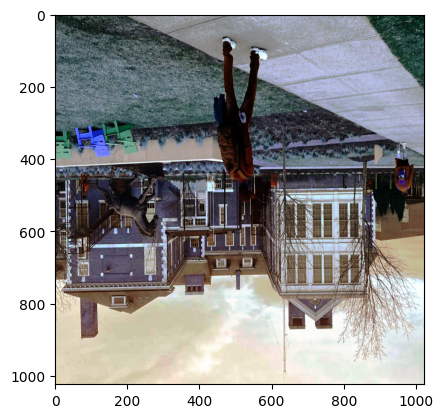

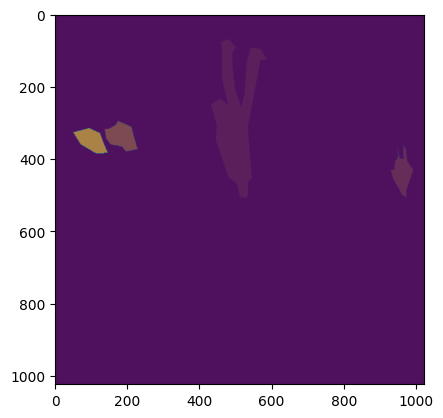

In [24]:
img, target = train_dataset.__getitem__(1)

# Plot image
plt.imshow(img.permute(1, 2, 0))
plt.show()

# Plot mask
mask = target['masks']
for i in range(mask.shape[0]): 
    plt.imshow(mask[i], alpha=0.5)

plt.show()

In [17]:
def train_one_epoch(loader, model, optimizer, device):
    loop = tqdm(loader)
    running_vloss = 0
    model.train()
    for batch_idx, (images, targets) in enumerate(loop):
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
        
        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())
        running_vloss += losses

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()
    
    avg_vloss = running_vloss / (batch_idx + 1)

    print(f"Total loss: {losses.item()}")
    return avg_vloss #losses.item()

In [25]:
best_vloss = np.inf
def validate(loader, model, optimizer, device, epoch):
    global best_vloss
    loop = tqdm(loader)
    running_vloss = 0
    model.train()
    for batch_idx, (images, targets) in enumerate(loop):
        if batch_idx == 0:
            # Plot image
            # print(images.shape)
            plt.imshow(images[0].permute(1, 2, 0))
            plt.show()

            # Plot image
            plt.imshow(images[0].permute(1, 2, 0))

            # Plot mask
            mask = targets[0]['masks']
            for i in range(mask.shape[0]): 
                plt.imshow(mask[i], alpha=0.5)

        plt.show()

        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
        
        with torch.no_grad():
          loss_dict = model(images, targets)
        
        losses = sum(loss for loss in loss_dict.values())
        running_vloss += losses
        
    avg_vloss = running_vloss / (batch_idx + 1)
    
    print(f"Avg Valid Loss: {avg_vloss}")
    if avg_vloss < best_vloss:
      best_vloss = avg_vloss
      if SAVE_MODEL:
            print("Model improved, saving...")
            checkpoint = {
                "state_dict": model.state_dict(),
                "optimizer": optimizer.state_dict(),
            }
            save_checkpoint(checkpoint, filename=f"/content/drive/MyDrive/MaskRCNN/Best.pth.tar")
    print('\n')
    return avg_vloss

In [26]:
from torchvision.models.detection._utils import Matcher
from torchvision.ops.boxes import box_iou

iou_thresholds = [.5, .55, .6, .65, .7, .75, .8, .85, .9, .95]
iou_thresholds_mean = sum(iou_thresholds)/len(iou_thresholds)

def sartorius_iou(src_boxes, pred_boxes):
      """
      The accuracy method is not the one used in the evaluator but very similar
      """

      total_gt = len(src_boxes)
      total_pred = len(pred_boxes)

      thrshs = torch.tensor(iou_thresholds)
      thrshs_mean = torch.mean(thrshs)

      def iou(threshold):
          # Define the matcher and distance matrix based on iou
          matcher = Matcher(threshold,threshold,allow_low_quality_matches=False) 
          match_quality_matrix = box_iou(src_boxes,pred_boxes)

          results = matcher(match_quality_matrix)

          true_positive = torch.count_nonzero(results.unique() != -1)
          matched_elements = results[results > -1]

          #in Matcher, a pred element can be matched only twice 
          false_positive = torch.count_nonzero(results == -1) + ( len(matched_elements) - len(torch.unique(matched_elements)))
          false_negative = total_gt - true_positive

          acc = true_positive / ( true_positive + false_positive + false_negative )

          return acc

      if total_gt > 0 and total_pred > 0:
        return torch.tensor(sum([iou(t) for t in iou_thresholds]) / iou_thresholds_mean)
  
      elif total_gt == 0:
          if total_pred > 0:
              return torch.tensor(0.)
          else:
              return torch.tensor(1.)
      elif total_gt > 0 and total_pred == 0:
            return torch.tensor(0.)

In [27]:
def validate_accuracy(loader, model, optimizer, device, epoch):
    loop = tqdm(loader)
    running_vloss = []
    model.eval()
    for batch_idx, (images, targets) in enumerate(loop):
        bsize = images.shape[0]
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
        
        with torch.no_grad():
          pred_boxes = model(images, targets)
        
        val_accuracy = torch.mean(torch.stack([sartorius_iou(b["boxes"],pb["boxes"]) for b,pb in zip(targets,pred_boxes)]))
        # val_accuracy = val_accuracy / bsize
        
        running_vloss.append(val_accuracy.item())
        
    avg_vloss = np.mean(running_vloss)

    print("ACC : ", avg_vloss)
    
    return avg_vloss, running_vloss

In [28]:
model = get_model(num_classes=10)
optimizer = torch.optim.AdamW(params=model.parameters(),
                                  lr=LEARNING_RATE,
                                  weight_decay=WEIGHT_DECAY)

Downloading: "https://download.pytorch.org/models/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth" to /root/.cache/torch/hub/checkpoints/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth
100%|██████████| 170M/170M [00:02<00:00, 80.4MB/s]


Epoch: 0


100%|██████████| 26/26 [00:31<00:00,  1.22s/it]


Total loss: 0.38383111357688904


  0%|          | 0/4 [00:00<?, ?it/s]

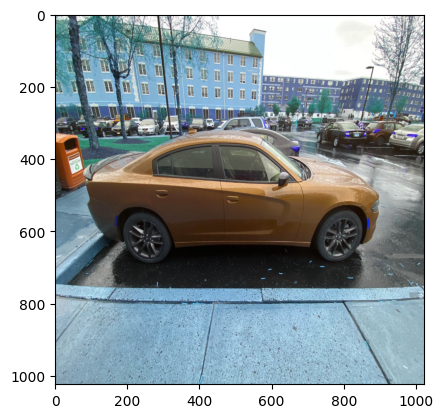

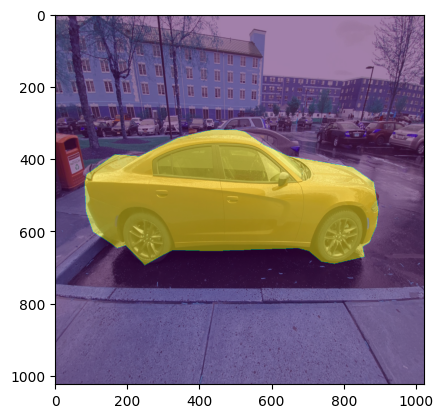

100%|██████████| 4/4 [00:03<00:00,  1.30it/s]


Avg Valid Loss: 0.4350442588329315




  0%|          | 0/4 [00:00<?, ?it/s]<ipython-input-26-3f9cfb72e851>:37: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(sum([iou(t) for t in iou_thresholds]) / iou_thresholds_mean)
100%|██████████| 4/4 [00:02<00:00,  1.43it/s]


ACC :  0.46523191779851913


  0%|          | 0/4 [00:00<?, ?it/s]

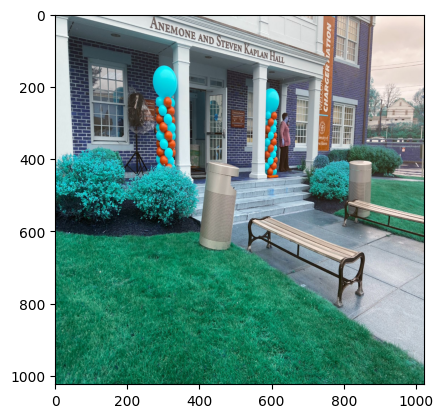

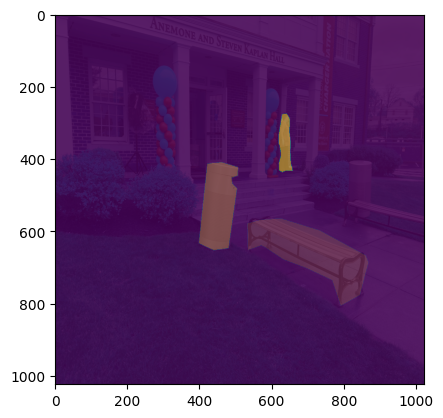

100%|██████████| 4/4 [00:03<00:00,  1.25it/s]


Avg Valid Loss: 0.4143562316894531
Model improved, saving...
=> Saving checkpoint




100%|██████████| 4/4 [00:02<00:00,  1.51it/s]


ACC :  0.4308454692363739
Train Losses:  [tensor(0.4359, device='cuda:0', grad_fn=<DivBackward0>)]
Validation Losses:  [tensor(0.4350, device='cuda:0')]
Test Losses:  [tensor(0.4144, device='cuda:0')]
Epoch: 1


100%|██████████| 26/26 [00:32<00:00,  1.26s/it]


Total loss: 0.46184247732162476


  0%|          | 0/4 [00:00<?, ?it/s]

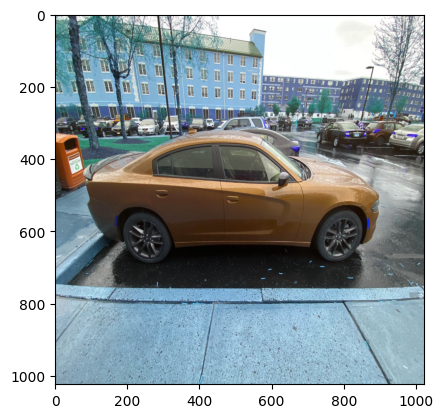

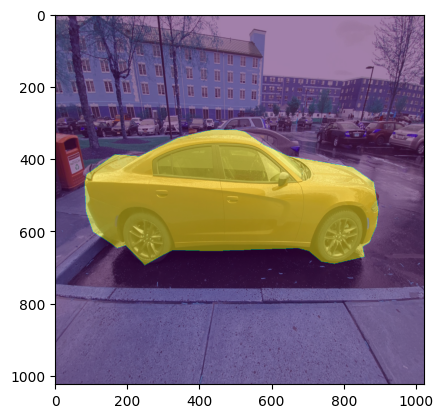

100%|██████████| 4/4 [00:02<00:00,  1.34it/s]


Avg Valid Loss: 0.41517388820648193




100%|██████████| 4/4 [00:02<00:00,  1.53it/s]


ACC :  0.6509690880775452


  0%|          | 0/4 [00:00<?, ?it/s]

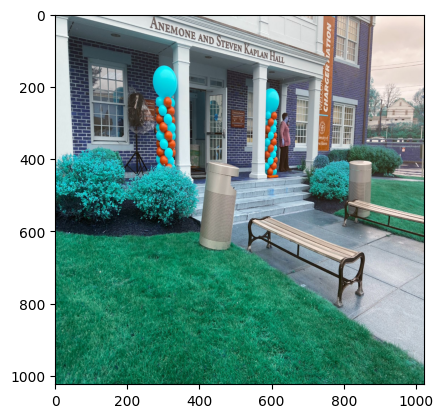

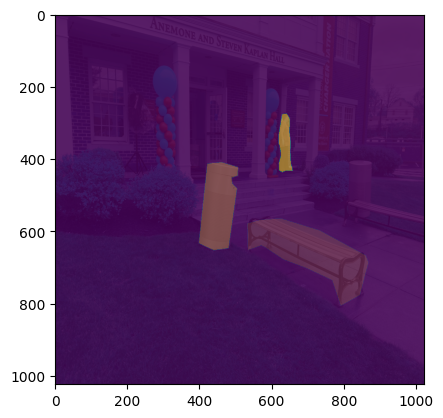

100%|██████████| 4/4 [00:03<00:00,  1.25it/s]


Avg Valid Loss: 0.4137423634529114
Model improved, saving...
=> Saving checkpoint




100%|██████████| 4/4 [00:02<00:00,  1.53it/s]


ACC :  0.49216704070568085
Train Losses:  [tensor(0.4359, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.4129, device='cuda:0', grad_fn=<DivBackward0>)]
Validation Losses:  [tensor(0.4350, device='cuda:0'), tensor(0.4152, device='cuda:0')]
Test Losses:  [tensor(0.4144, device='cuda:0'), tensor(0.4137, device='cuda:0')]
Epoch: 2


100%|██████████| 26/26 [00:41<00:00,  1.61s/it]


Total loss: 0.5185967087745667


  0%|          | 0/4 [00:00<?, ?it/s]

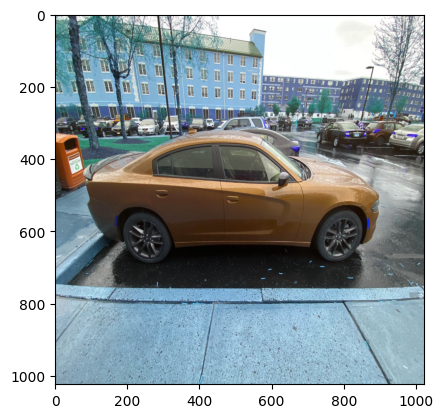

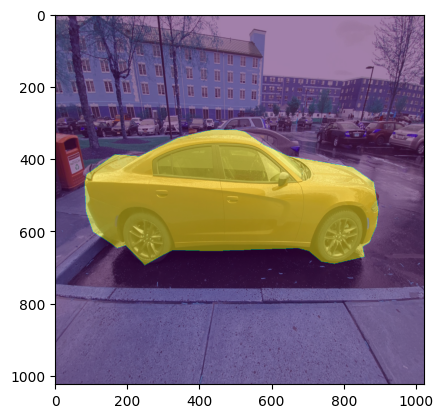

100%|██████████| 4/4 [00:03<00:00,  1.31it/s]


Avg Valid Loss: 0.4086920917034149
Model improved, saving...
=> Saving checkpoint




100%|██████████| 4/4 [00:02<00:00,  1.51it/s]


ACC :  1.064645417034626


  0%|          | 0/4 [00:00<?, ?it/s]

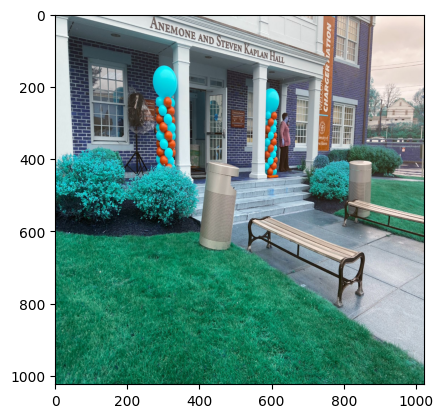

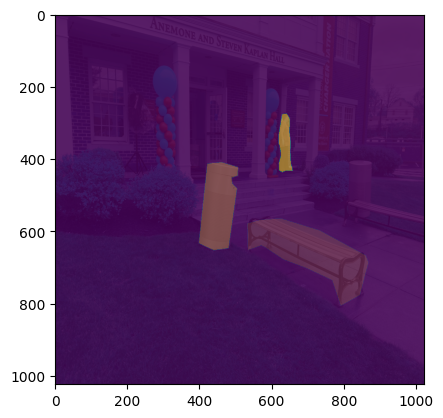

100%|██████████| 4/4 [00:03<00:00,  1.24it/s]


Avg Valid Loss: 0.39091283082962036
Model improved, saving...
=> Saving checkpoint




100%|██████████| 4/4 [00:02<00:00,  1.55it/s]


ACC :  0.8075718879699707
Train Losses:  [tensor(0.4359, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.4129, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.3988, device='cuda:0', grad_fn=<DivBackward0>)]
Validation Losses:  [tensor(0.4350, device='cuda:0'), tensor(0.4152, device='cuda:0'), tensor(0.4087, device='cuda:0')]
Test Losses:  [tensor(0.4144, device='cuda:0'), tensor(0.4137, device='cuda:0'), tensor(0.3909, device='cuda:0')]
Epoch: 3


100%|██████████| 26/26 [00:36<00:00,  1.41s/it]


Total loss: 0.5228503346443176


  0%|          | 0/4 [00:00<?, ?it/s]

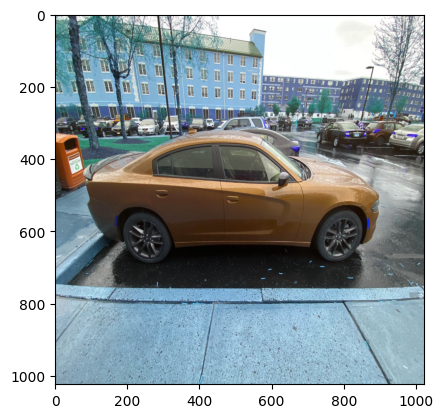

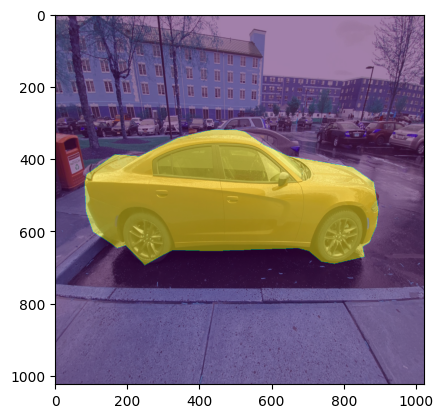

100%|██████████| 4/4 [00:03<00:00,  1.30it/s]


Avg Valid Loss: 0.3958435356616974




100%|██████████| 4/4 [00:02<00:00,  1.54it/s]


ACC :  0.952935129404068


  0%|          | 0/4 [00:00<?, ?it/s]

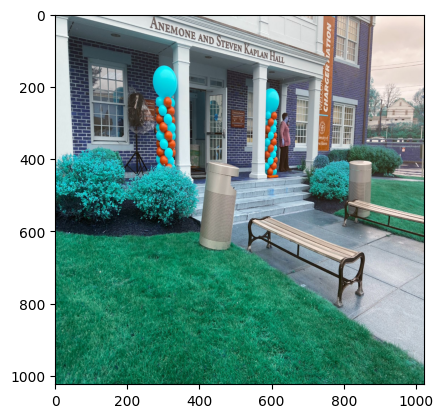

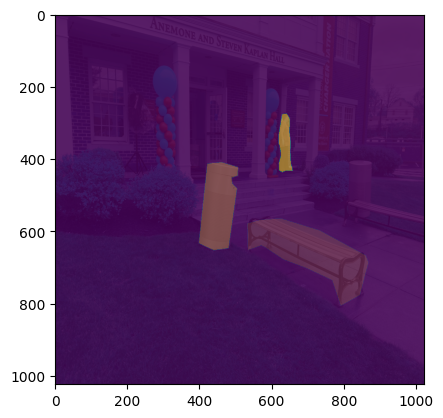

100%|██████████| 4/4 [00:03<00:00,  1.29it/s]


Avg Valid Loss: 0.3787095844745636
Model improved, saving...
=> Saving checkpoint




100%|██████████| 4/4 [00:02<00:00,  1.54it/s]


ACC :  1.0795754939317703
Train Losses:  [tensor(0.4359, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.4129, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.3988, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.3715, device='cuda:0', grad_fn=<DivBackward0>)]
Validation Losses:  [tensor(0.4350, device='cuda:0'), tensor(0.4152, device='cuda:0'), tensor(0.4087, device='cuda:0'), tensor(0.3958, device='cuda:0')]
Test Losses:  [tensor(0.4144, device='cuda:0'), tensor(0.4137, device='cuda:0'), tensor(0.3909, device='cuda:0'), tensor(0.3787, device='cuda:0')]
Epoch: 4


100%|██████████| 26/26 [00:37<00:00,  1.43s/it]


Total loss: 0.4279496967792511


  0%|          | 0/4 [00:00<?, ?it/s]

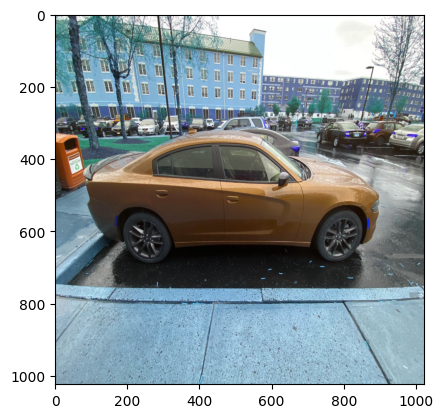

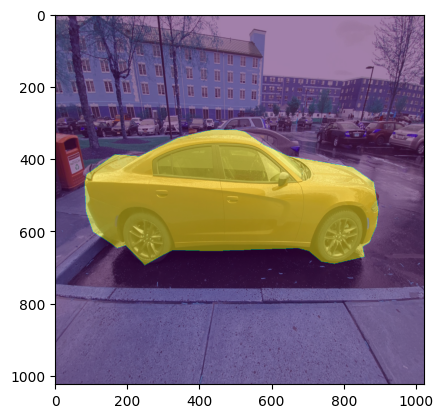

100%|██████████| 4/4 [00:03<00:00,  1.27it/s]


Avg Valid Loss: 0.4150313138961792




100%|██████████| 4/4 [00:02<00:00,  1.56it/s]


ACC :  1.5309183970093727


  0%|          | 0/4 [00:00<?, ?it/s]

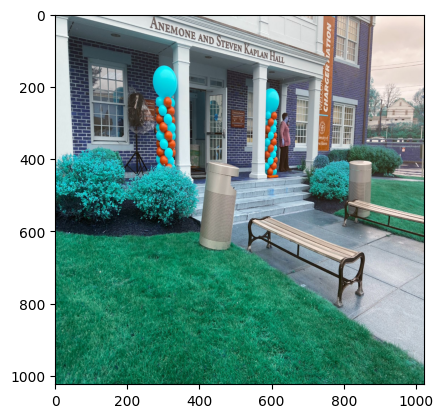

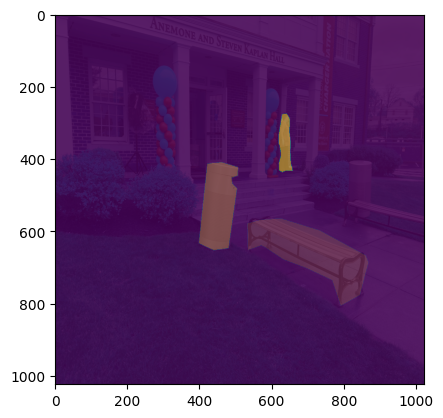

100%|██████████| 4/4 [00:03<00:00,  1.25it/s]


Avg Valid Loss: 0.40124380588531494




100%|██████████| 4/4 [00:02<00:00,  1.59it/s]


ACC :  1.3015753328800201
Train Losses:  [tensor(0.4359, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.4129, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.3988, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.3715, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.3598, device='cuda:0', grad_fn=<DivBackward0>)]
Validation Losses:  [tensor(0.4350, device='cuda:0'), tensor(0.4152, device='cuda:0'), tensor(0.4087, device='cuda:0'), tensor(0.3958, device='cuda:0'), tensor(0.4150, device='cuda:0')]
Test Losses:  [tensor(0.4144, device='cuda:0'), tensor(0.4137, device='cuda:0'), tensor(0.3909, device='cuda:0'), tensor(0.3787, device='cuda:0'), tensor(0.4012, device='cuda:0')]
Epoch: 5


100%|██████████| 26/26 [00:33<00:00,  1.30s/it]


Total loss: 0.27459198236465454


  0%|          | 0/4 [00:00<?, ?it/s]

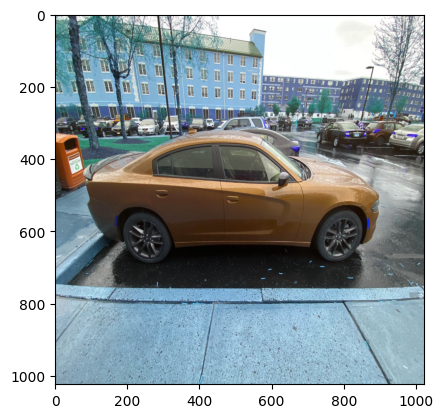

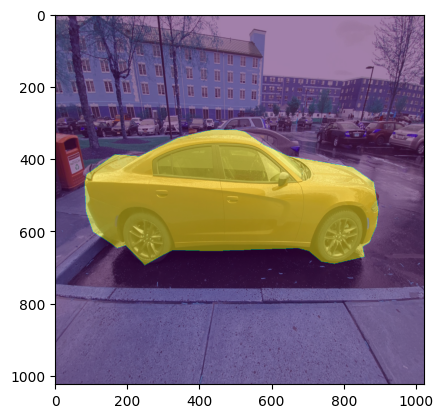

100%|██████████| 4/4 [00:03<00:00,  1.16it/s]


Avg Valid Loss: 0.43648600578308105




100%|██████████| 4/4 [00:02<00:00,  1.56it/s]


ACC :  1.7616964876651764


  0%|          | 0/4 [00:00<?, ?it/s]

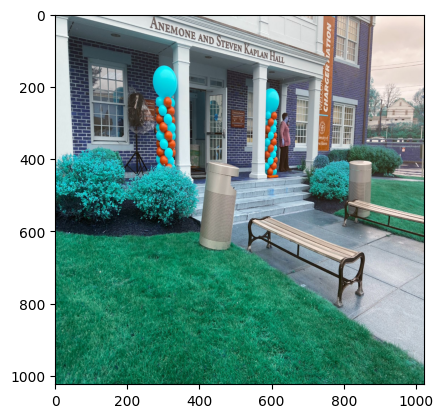

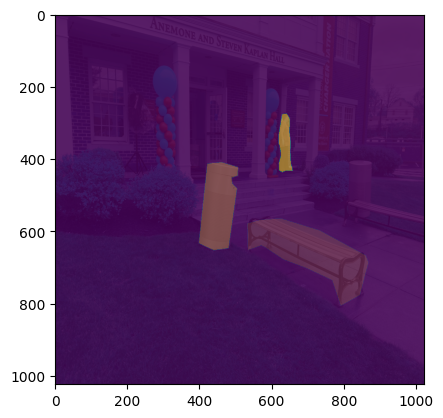

100%|██████████| 4/4 [00:03<00:00,  1.21it/s]


Avg Valid Loss: 0.3837548494338989




100%|██████████| 4/4 [00:02<00:00,  1.53it/s]


ACC :  1.1819680333137512
Train Losses:  [tensor(0.4359, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.4129, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.3988, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.3715, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.3598, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.3538, device='cuda:0', grad_fn=<DivBackward0>)]
Validation Losses:  [tensor(0.4350, device='cuda:0'), tensor(0.4152, device='cuda:0'), tensor(0.4087, device='cuda:0'), tensor(0.3958, device='cuda:0'), tensor(0.4150, device='cuda:0'), tensor(0.4365, device='cuda:0')]
Test Losses:  [tensor(0.4144, device='cuda:0'), tensor(0.4137, device='cuda:0'), tensor(0.3909, device='cuda:0'), tensor(0.3787, device='cuda:0'), tensor(0.4012, device='cuda:0'), tensor(0.3838, device='cuda:0')]
Epoch: 6


100%|██████████| 26/26 [00:34<00:00,  1.34s/it]


Total loss: 0.39559119939804077


  0%|          | 0/4 [00:00<?, ?it/s]

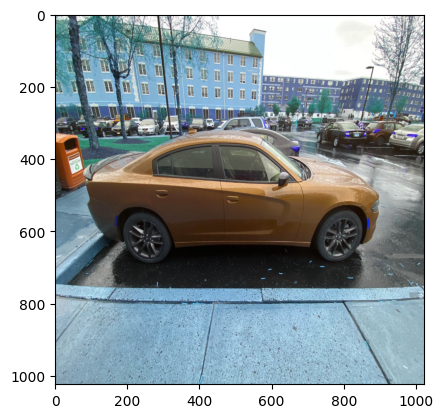

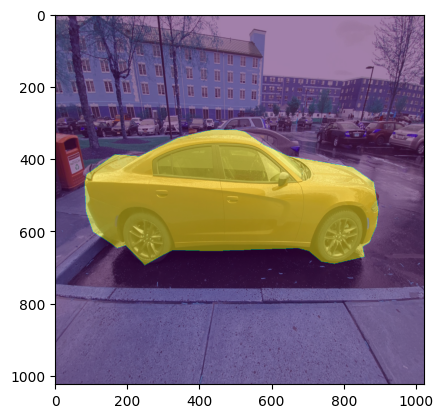

100%|██████████| 4/4 [00:03<00:00,  1.23it/s]


Avg Valid Loss: 0.39923346042633057




100%|██████████| 4/4 [00:02<00:00,  1.54it/s]


ACC :  1.9617128297686577


  0%|          | 0/4 [00:00<?, ?it/s]

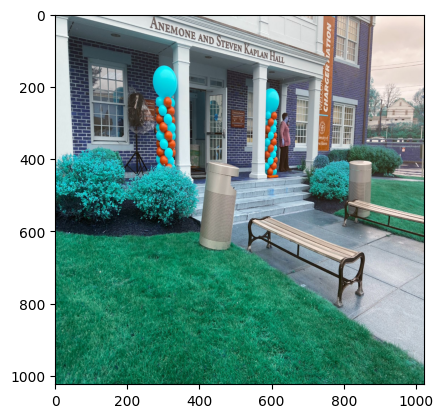

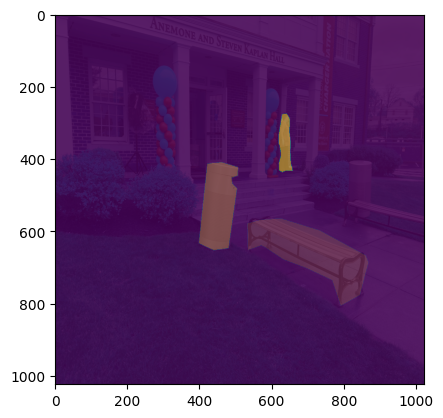

100%|██████████| 4/4 [00:03<00:00,  1.27it/s]


Avg Valid Loss: 0.37590593099594116
Model improved, saving...
=> Saving checkpoint




100%|██████████| 4/4 [00:02<00:00,  1.52it/s]


ACC :  1.4077032506465912
Train Losses:  [tensor(0.4359, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.4129, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.3988, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.3715, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.3598, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.3538, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.3263, device='cuda:0', grad_fn=<DivBackward0>)]
Validation Losses:  [tensor(0.4350, device='cuda:0'), tensor(0.4152, device='cuda:0'), tensor(0.4087, device='cuda:0'), tensor(0.3958, device='cuda:0'), tensor(0.4150, device='cuda:0'), tensor(0.4365, device='cuda:0'), tensor(0.3992, device='cuda:0')]
Test Losses:  [tensor(0.4144, device='cuda:0'), tensor(0.4137, device='cuda:0'), tensor(0.3909, device='cuda:0'), tensor(0.3787, device='cuda:0'), tensor(0.4012, device='cuda:0'), tensor(0.3838, device='cuda:0'), tensor(0.3759, device='cuda:0')]
Epoch: 7


100%|██████████| 26/26 [00:40<00:00,  1.57s/it]


Total loss: 0.48351651430130005


  0%|          | 0/4 [00:00<?, ?it/s]

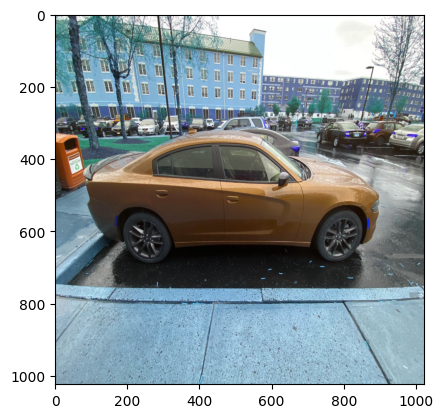

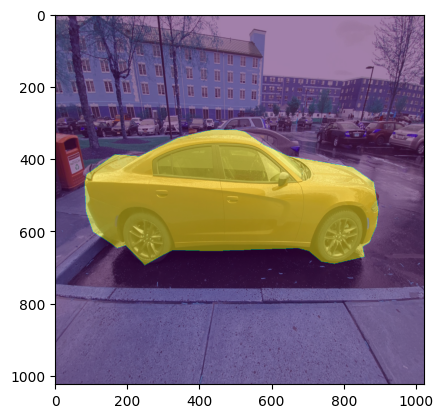

100%|██████████| 4/4 [00:03<00:00,  1.20it/s]


Avg Valid Loss: 0.396678626537323




100%|██████████| 4/4 [00:02<00:00,  1.56it/s]


ACC :  2.349252328276634


  0%|          | 0/4 [00:00<?, ?it/s]

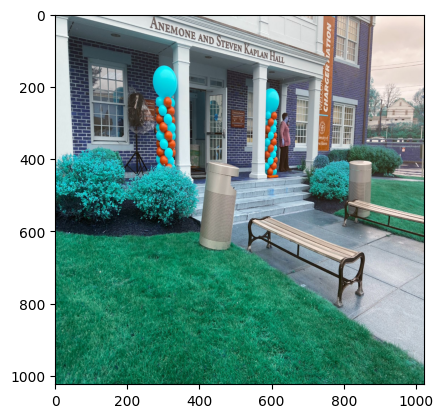

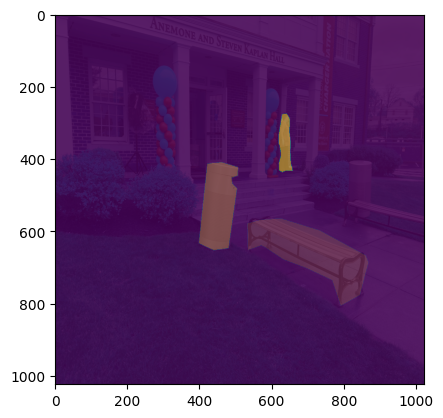

100%|██████████| 4/4 [00:03<00:00,  1.25it/s]


Avg Valid Loss: 0.40644943714141846




100%|██████████| 4/4 [00:02<00:00,  1.57it/s]


ACC :  2.023556023836136
Train Losses:  [tensor(0.4359, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.4129, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.3988, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.3715, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.3598, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.3538, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.3263, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.3215, device='cuda:0', grad_fn=<DivBackward0>)]
Validation Losses:  [tensor(0.4350, device='cuda:0'), tensor(0.4152, device='cuda:0'), tensor(0.4087, device='cuda:0'), tensor(0.3958, device='cuda:0'), tensor(0.4150, device='cuda:0'), tensor(0.4365, device='cuda:0'), tensor(0.3992, device='cuda:0'), tensor(0.3967, device='cuda:0')]
Test Losses:  [tensor(0.4144, device='cuda:0'), tensor(0.4137, device='cuda:0'), tensor(0.3909, device='cuda:0'), tensor(0.3787, device='cuda:0'), tensor(0.4012, device='cuda:0'), tensor(0.3838, device='cuda:0'), tenso

100%|██████████| 26/26 [00:35<00:00,  1.36s/it]


Total loss: 0.29529646039009094


  0%|          | 0/4 [00:00<?, ?it/s]

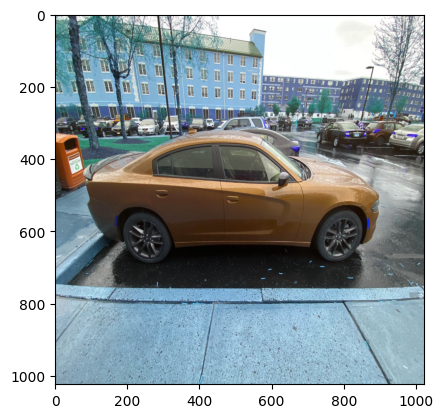

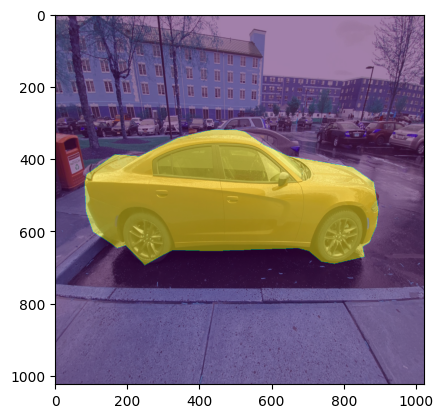

100%|██████████| 4/4 [00:03<00:00,  1.29it/s]


Avg Valid Loss: 0.4091017246246338




100%|██████████| 4/4 [00:02<00:00,  1.56it/s]


ACC :  2.736545741558075


  0%|          | 0/4 [00:00<?, ?it/s]

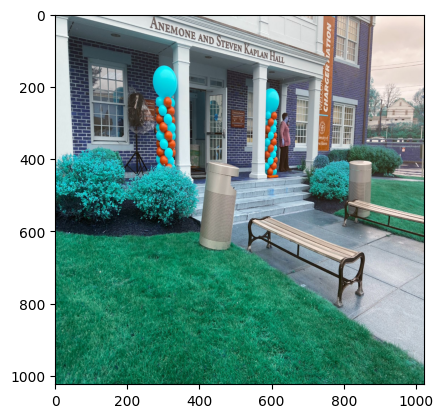

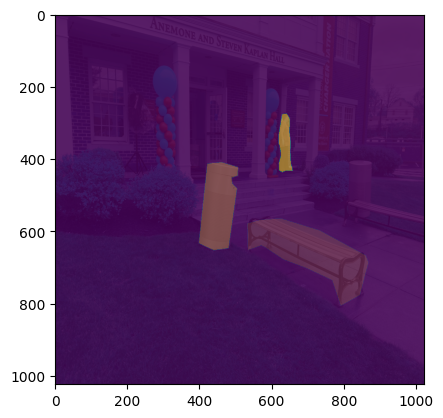

100%|██████████| 4/4 [00:03<00:00,  1.17it/s]


Avg Valid Loss: 0.40487390756607056




100%|██████████| 4/4 [00:02<00:00,  1.62it/s]


ACC :  2.7283454537391663
Train Losses:  [tensor(0.4359, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.4129, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.3988, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.3715, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.3598, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.3538, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.3263, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.3215, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.3136, device='cuda:0', grad_fn=<DivBackward0>)]
Validation Losses:  [tensor(0.4350, device='cuda:0'), tensor(0.4152, device='cuda:0'), tensor(0.4087, device='cuda:0'), tensor(0.3958, device='cuda:0'), tensor(0.4150, device='cuda:0'), tensor(0.4365, device='cuda:0'), tensor(0.3992, device='cuda:0'), tensor(0.3967, device='cuda:0'), tensor(0.4091, device='cuda:0')]
Test Losses:  [tensor(0.4144, device='cuda:0'), tensor(0.4137, device='cuda:0'), tensor(0.3909, device='cuda:0'), tensor(0.3787

100%|██████████| 26/26 [00:32<00:00,  1.25s/it]


Total loss: 0.3298543095588684


  0%|          | 0/4 [00:00<?, ?it/s]

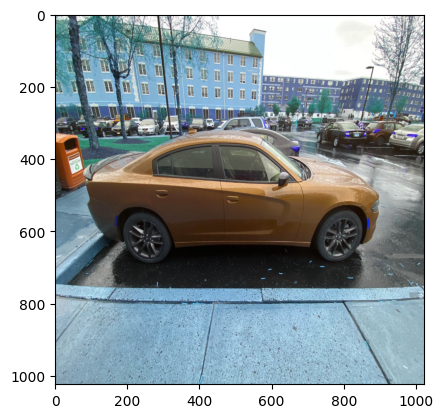

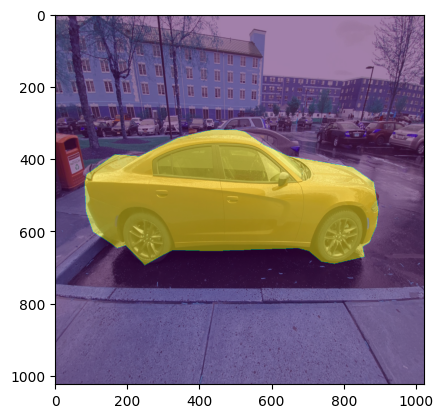

100%|██████████| 4/4 [00:03<00:00,  1.23it/s]


Avg Valid Loss: 0.39763331413269043




100%|██████████| 4/4 [00:02<00:00,  1.49it/s]


ACC :  1.9820592999458313


  0%|          | 0/4 [00:00<?, ?it/s]

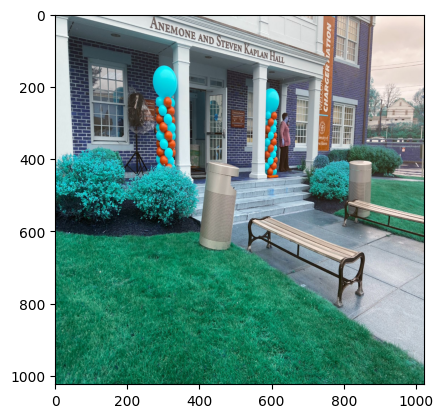

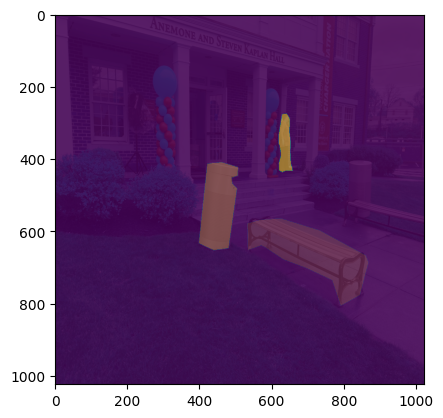

100%|██████████| 4/4 [00:03<00:00,  1.17it/s]


Avg Valid Loss: 0.3925195336341858




100%|██████████| 4/4 [00:02<00:00,  1.60it/s]


ACC :  1.9927009642124176
Train Losses:  [tensor(0.4359, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.4129, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.3988, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.3715, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.3598, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.3538, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.3263, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.3215, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.3136, device='cuda:0', grad_fn=<DivBackward0>), tensor(0.3163, device='cuda:0', grad_fn=<DivBackward0>)]
Validation Losses:  [tensor(0.4350, device='cuda:0'), tensor(0.4152, device='cuda:0'), tensor(0.4087, device='cuda:0'), tensor(0.3958, device='cuda:0'), tensor(0.4150, device='cuda:0'), tensor(0.4365, device='cuda:0'), tensor(0.3992, device='cuda:0'), tensor(0.3967, device='cuda:0'), tensor(0.4091, device='cuda:0'), tensor(0.3976, device='cuda:0')]
Test Losses:  [tensor(0.4144, device=

In [31]:
model.train()
val_loss = []
train_loss = []
test_loss = []
val_acc = []
test_acc = []

for epoch in range(NUM_EPOCHS):
    print(f"Epoch: {epoch}")
    
    tloss = train_one_epoch(train_loader, model, optimizer, DEVICE)
    
    vloss= validate(valid_loader, model, optimizer, DEVICE, epoch)
    vacc = validate_accuracy(valid_loader, model, optimizer, DEVICE, epoch)

    testloss = validate(test_loader, model, optimizer, DEVICE, epoch)
    testacc = validate_accuracy(test_loader, model, optimizer, DEVICE, epoch)

    val_loss.append(vloss)
    train_loss.append(tloss)
    test_loss.append(testloss)

    val_acc.append(vacc)
    test_acc.append(testacc)
    print("Train Losses: ",train_loss)    
    print("Validation Losses: ",val_loss)
    print("Test Losses: ",test_loss)

In [45]:
print("Train Losses: ", [loss.item() for loss in train_loss])    
print("Validation Losses: ",[loss.item() for loss in val_loss])
print("Test Losses: ",[loss.item() for loss in test_loss])

Train Losses:  [0.43591710925102234, 0.4128521680831909, 0.39878836274147034, 0.371512770652771, 0.3598138093948364, 0.3538070619106293, 0.32629135251045227, 0.3214913010597229, 0.3135804235935211, 0.3162546753883362]
Validation Losses:  [0.4350442588329315, 0.41517388820648193, 0.4086920917034149, 0.3958435356616974, 0.4150313138961792, 0.43648600578308105, 0.39923346042633057, 0.396678626537323, 0.4091017246246338, 0.39763331413269043]
Test Losses:  [0.4143562316894531, 0.4137423634529114, 0.39091283082962036, 0.3787095844745636, 0.40124380588531494, 0.3837548494338989, 0.37590593099594116, 0.40644943714141846, 0.40487390756607056, 0.3925195336341858]


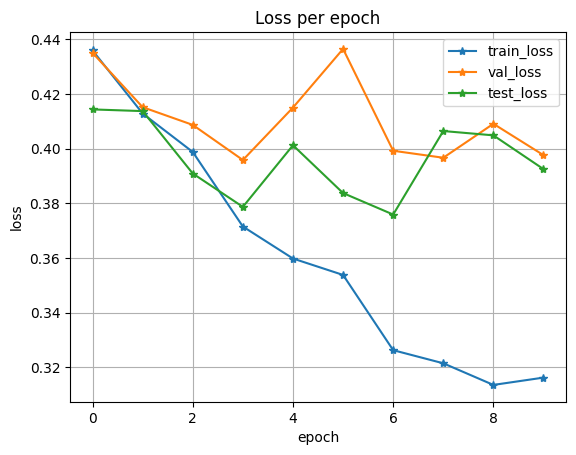

In [46]:
plt.plot([i.item() for i in train_loss], label='train_loss', marker='*')
plt.plot([i.item() for i in val_loss], label='val_loss', marker='*')
plt.plot([i.item() for i in test_loss], label='test_loss', marker='*')
plt.title('Loss per epoch'); plt.ylabel('loss');
plt.xlabel('epoch')
plt.legend(), plt.grid()
plt.show()

Validation Accuracy:  (2.736545741558075, [1.3550586700439453, 0.6292421817779541, 4.331340312957764, 4.630541801452637])
Test Accuracy:  (2.7283454537391663, [1.7697043418884277, 1.2471263408660889, 3.6206893920898438, 4.275861740112305])


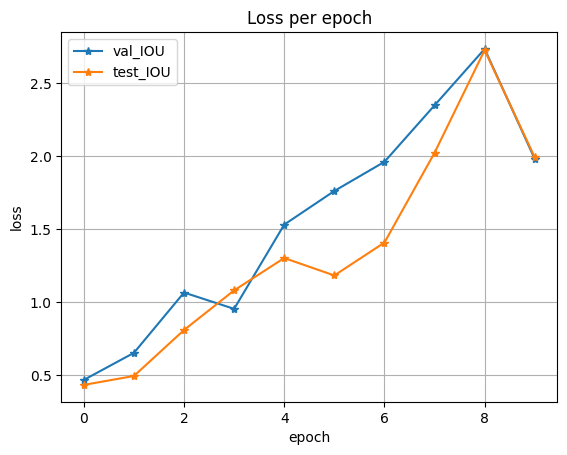

In [47]:
plt.plot([i[0] for i in val_acc], label='val_IOU', marker='*')
plt.plot([i[0] for i in test_acc], label='test_IOU', marker='*')
print("Validation Accuracy: ", max(val_acc))
print("Test Accuracy: ", max(test_acc))
plt.title('Loss per epoch'); plt.ylabel('loss');
plt.xlabel('epoch')
plt.legend(), plt.grid()
plt.show()

## Test

In [48]:
import cv2

In [49]:
def predict_single_frame(frame):
    images = cv2.resize(frame, IMAGE_SIZE, cv2.INTER_LINEAR)/255
    images = torch.as_tensor(images, dtype=torch.float32).unsqueeze(0)
    images = images.swapaxes(1, 3).swapaxes(2, 3)
    images = list(image.to(DEVICE) for image in images)
    
    with torch.no_grad():
      pred = model(images)
    
    im = images[0].swapaxes(0, 2).swapaxes(0, 1).detach().cpu().numpy().astype(np.float32)
    im2 = np.zeros_like(im).astype(np.float32)
    for i in range(len(pred[0]['masks'])):
        msk=pred[0]['masks'][i,0].detach().cpu().numpy()
        scr=pred[0]['scores'][i].detach().cpu().numpy()
        box=pred[0]['boxes'][i].detach().cpu().numpy()
        
        if scr>0.5 :
            cv2.rectangle(im, (int(box[0]), int(box[1])), (int(box[2]), int(box[3])), (0,0,1), 2)
            cv2.putText(im, "{0:.2f}%".format(scr*100), (int(box[0]+5), int(box[1])+15), cv2.FONT_HERSHEY_SIMPLEX,
                        0.5, (0,0,1), 2, cv2.LINE_AA)
            im2[:,:,0][msk>0.5] = np.random.uniform(0,1)
            im2[:, :, 1][msk > 0.5] = np.random.uniform(0,1)
            im2[:, :, 2][msk > 0.5] = np.random.uniform(0,1)

    return (cv2.addWeighted(im, 0.5, im2, 0.5,0)*255).astype(np.uint8)

In [50]:
model.eval()

MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(in

In [51]:
import glob

In [52]:
test_images = glob.glob("/content/test/images/*")
test_images.__len__()

13

####################################################################################################
/content/test/images/4029d08d-IMG-20230429-WA0029.jpg


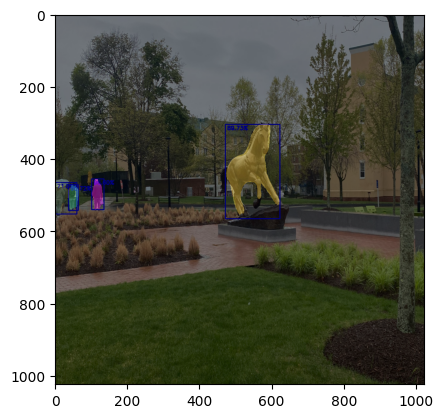

####################################################################################################
/content/test/images/bc195045-IMG-20230429-WA0038.jpg


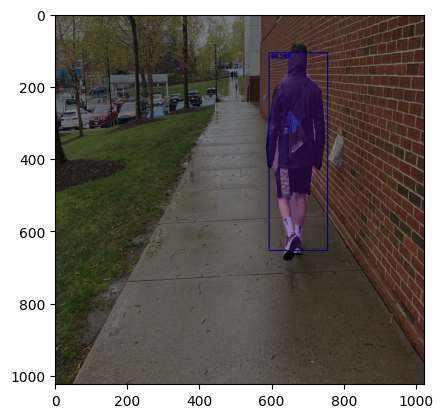

####################################################################################################
/content/test/images/bf4395e7-IMG-20230429-WA0035.jpg


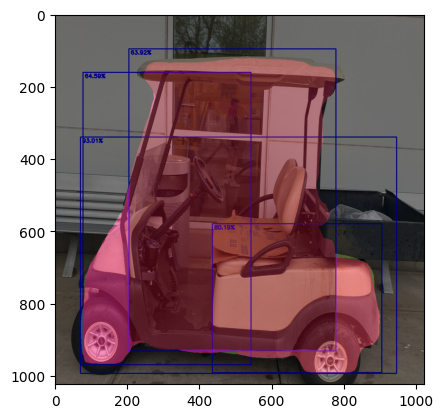

####################################################################################################
/content/test/images/b44cbfa9-IMG-20230429-WA0027.jpg


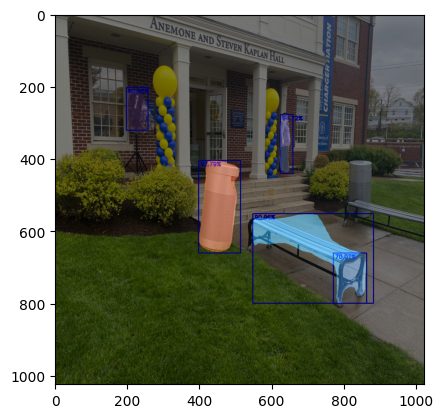

####################################################################################################
/content/test/images/22915c45-IMG-20230429-WA0037.jpg


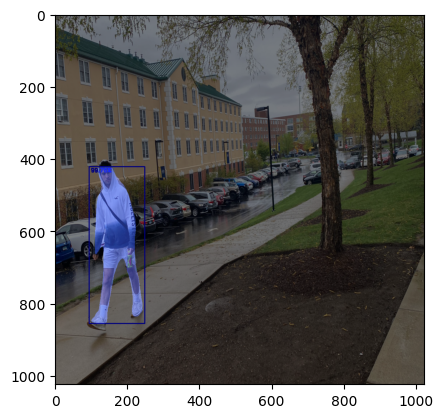

####################################################################################################
/content/test/images/b5a42534-IMG-20230429-WA0033.jpg


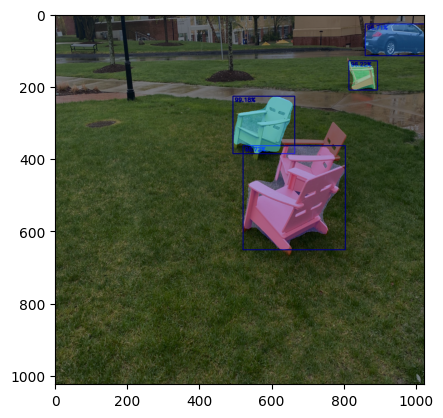

####################################################################################################
/content/test/images/815950ab-IMG-20230429-WA0034.jpg


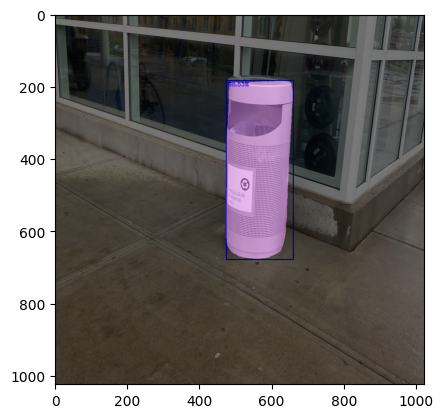

####################################################################################################
/content/test/images/6d7c8393-IMG-20230429-WA0067.jpg


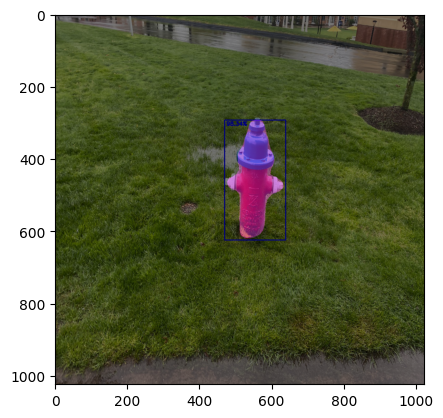

####################################################################################################
/content/test/images/e4bef85d-IMG-20230429-WA0036.jpg


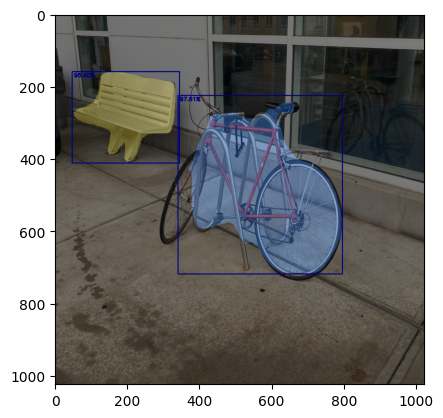

####################################################################################################
/content/test/images/49fdd072-IMG-20230429-WA0039.jpg


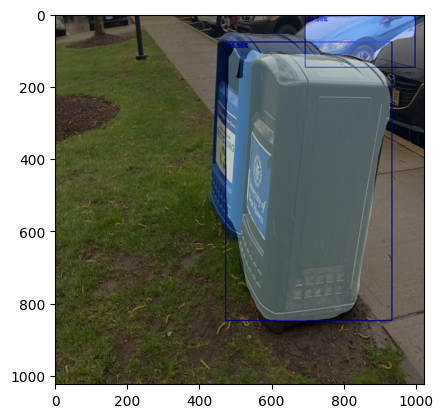

####################################################################################################
/content/test/images/92e3db22-IMG-20230429-WA0075.jpg


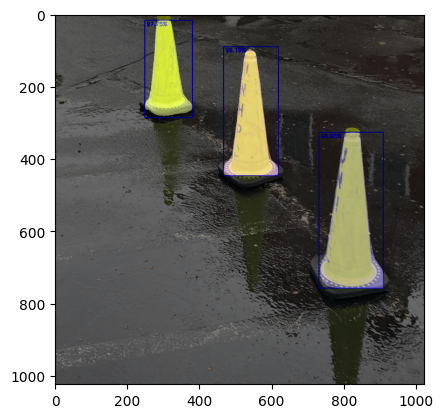

####################################################################################################
/content/test/images/ab7d37f6-IMG-20230429-WA0028.jpg


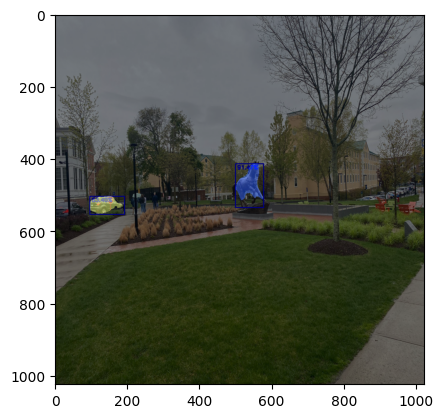

####################################################################################################
/content/test/images/b7fefc24-IMG-20230429-WA0031.jpg


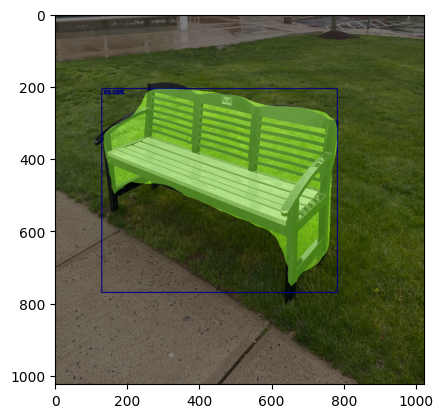

In [53]:
for path in test_images:
    print("#"*100)
    print(path)
    frame = plt.imread(path)
    out = predict_single_frame(frame)
    plt.imshow(out)
    plt.show()

# Deployment using Gradio

In [54]:
!pip install gradio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 76.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.9/129.9 kB 16.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 73.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.7/45.7 kB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.5/50.5 kB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 26.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 286.7/286.7 kB 31.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.6/135.6 kB 17.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.0/57.0 kB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.3/75.3 kB 10.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3

Inference Code

In [61]:

# from torchvision.models.detection import maskrcnn_resnet50_fpn
def predict_single_frame_inf(frame):
    images = cv2.resize(frame, IMAGE_SIZE, cv2.INTER_LINEAR)/255
    images = torch.as_tensor(images, dtype=torch.float32).unsqueeze(0)
    images = images.swapaxes(1, 3).swapaxes(2, 3)
    images = list(image.to(DEVICE) for image in images)

    # web_model = torch.load('/content/drive/MyDrive/MaskRCNN/Best.pth.tar')
    # web_model.eval()
    # device = torch.device("cuda")
    # web_model =maskrcnn_resnet50_fpn(pretrained=True)
    # web_model.load_state_dict(torch.load('/content/drive/MyDrive/MaskRCNN/MaskRCNN/notebook/Best.pth.tar', map_location=torch.device('cuda:0')))
    # web_model.to(device)
    
    # model.eval()
    with torch.no_grad():
      pred = model(images)
    

    im = images[0].swapaxes(0, 2).swapaxes(0, 1).detach().cpu().numpy().astype(np.float32)
    im2 = np.zeros_like(im).astype(np.float32)
    for i in range(len(pred[0]['masks'])):
        msk=pred[0]['masks'][i,0].detach().cpu().numpy()
        scr=pred[0]['scores'][i].detach().cpu().numpy()
        box=pred[0]['boxes'][i].detach().cpu().numpy()
        
        if scr>0.5 :
            cv2.rectangle(im, (int(box[0]), int(box[1])), (int(box[2]), int(box[3])), (0,0,1), 2)
            cv2.putText(im, "{0:.2f}%".format(scr*100), (int(box[0]+5), int(box[1])+15), cv2.FONT_HERSHEY_SIMPLEX,
                        0.5, (0,0,1), 2, cv2.LINE_AA)
            im2[:,:,0][msk>0.5] = np.random.uniform(0,1)
            im2[:, :, 1][msk > 0.5] = np.random.uniform(0,1)
            im2[:, :, 2][msk > 0.5] = np.random.uniform(0,1)

    return (cv2.addWeighted(im, 0.5, im2, 0.5,0)*255).astype(np.uint8)

Read Images

In [63]:
import torch
import torchvision.transforms as transforms
from PIL import Image
import gradio as gr
import numpy as np

def sepia(input_img):
  data = predict_single_frame_inf(input_img)  
  output = Image.fromarray(data)
  return output


demo = gr.Interface(sepia, gr.Image(), "image")
demo.launch(share=True)


Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
Running on public URL: https://891d097c4bdafe9ee0.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades (NEW!), check out Spaces: https://huggingface.co/spaces
